## Investigation of triggered seismicity near Mount Rainier due to M8.2 Chignik Earthquake.

Author - Akash Kharita, Final year Geophysics student, Indian Institution of Technology Roorkee,
29 August, 2021 <br>
Licence - Creative Commons Attribution 4.0 (CC-BY) - https://creativecommons.org/licenses/ <br>
You are allowed to share and use the information here as long as you give the appropriate credit.

#### Geysers is the world's largest geothermal field and contains several geothermal power plants. Speaking of seismicity, number of earthquakes have increased significantly in the area due to water injection process. it is however, unlikely that there will ever be a major earthquake at the site because of absence of major faults in the region.<br>

In this jupyter notebook, I will try to investigate the effect of M8.2 Chignik earthquake near Mount Rainier, I will do the following steps - 

1) Download all the available waveform data within 1 degree radius from Mount Rainier <br>
2) Rotating the waveforms <br>
3) Observing the filtered waveforms(2-8Hz) and Unfiltered waveforms, selecting the good quality waveforms. <br>
4) Checking for correspondence between surface wave arrival and locally triggered earthquakes. <br>
5) Checking the available event catalog to see the rates of earthquakes swarms before and after the event and also checking for the delayed response. 

In [72]:
## Importing necessary dependencies
import obspy
from obspy import UTCDateTime
from obspy.clients.fdsn import Client
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
from glob import glob
import os
import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
import warnings 
warnings.filterwarnings('ignore')

#### We will be reuesting data from all the stations lying within 1 degree of Mount Saint Helens to investigate for triggered seismicity caused by surface waves resulting from 2021-07-29 Chignik Alaska Earthquake

In [4]:
lat,lon = 46.852886, -121.760374

In [5]:
import obspy
from obspy.clients.fdsn.mass_downloader import CircularDomain, \
    Restrictions, MassDownloader

origin_time = obspy.UTCDateTime(2021, 7, 29, 6, 15, 49)

# Circular domain around the epicenter. This will download all data between
# 70 and 90 degrees distance from the epicenter. This module also offers
# rectangular and global domains. More complex domains can be defined by
# inheriting from the Domain class.
domain = CircularDomain(latitude=46.1912, longitude=-122.944,
                        minradius=0.0, maxradius=1.0)

restrictions = Restrictions(
    # Get data from 5 minutes before the event to one hour after the
    # event. This defines the temporal bounds of the waveform data.
    starttime=origin_time - 0 * 60,
    endtime=origin_time + 3600,
    # You might not want to deal with gaps in the data. If this setting is
    # True, any trace with a gap/overlap will be discarded.
    reject_channels_with_gaps=True,
    # And you might only want waveforms that have data for at least 95 % of
    # the requested time span. Any trace that is shorter than 95 % of the
    # desired total duration will be discarded.
    minimum_length=0.95,
    # No two stations should be closer than 10 km to each other. This is
    # useful to for example filter out stations that are part of different
    # networks but at the same physical station. Settings this option to
    # zero or None will disable that filtering.
    minimum_interstation_distance_in_m=1E3,
    # Only HH or BH channels. If a station has HH channels, those will be
    # downloaded, otherwise the BH. Nothing will be downloaded if it has
    # neither. You can add more/less patterns if you like.
    channel_priorities=["HH[ZNE]", "BH[ZNE]"],
    # Location codes are arbitrary and there is no rule as to which
    # location is best. Same logic as for the previous setting.
    location_priorities=["", "00", "10"])

# No specified providers will result in all known ones being queried.
mdl = MassDownloader()
# The data will be downloaded to the ``./waveforms/`` and ``./stations/``
# folders with automatically chosen file names.
mdl.download(domain, restrictions, mseed_storage="waveforms_rainier",
             stationxml_storage="stations_rainier")

[2021-08-30 17:46:23,897] - obspy.clients.fdsn.mass_downloader - INFO: Initializing FDSN client(s) for BGR, EMSC, ETH, GEONET, GFZ, ICGC, INGV, IPGP, ISC, KNMI, KOERI, LMU, NCEDC, NIEP, NOA, RESIF, SCEDC, TEXNET, UIB-NORSAR, USGS, USP, ORFEUS, IRIS.
[2021-08-30 17:46:30,818] - obspy.clients.fdsn.mass_downloader - INFO: Cannot use client 'ISC' as it does not have 'dataselect' and/or 'station' services.
[2021-08-30 17:46:31,938] - obspy.clients.fdsn.mass_downloader - INFO: Cannot use client 'USGS' as it does not have 'dataselect' and/or 'station' services.
[2021-08-30 17:46:40,365] - obspy.clients.fdsn.mass_downloader - INFO: Cannot use client 'EMSC' as it does not have 'dataselect' and/or 'station' services.
[2021-08-30 17:46:40,415] - obspy.clients.fdsn.mass_downloader - INFO: Successfully initialized 20 client(s): BGR, ETH, GEONET, GFZ, ICGC, INGV, IPGP, KNMI, KOERI, LMU, NCEDC, NIEP, NOA, RESIF, SCEDC, TEXNET, UIB-NORSAR, USP, ORFEUS, IRIS.
[2021-08-30 17:46:40,586] - obspy.clients.f

[2021-08-30 17:48:03,560] - obspy.clients.fdsn.mass_downloader - INFO: Client 'TEXNET' - Requesting reliable availability.
[2021-08-30 17:48:04,254] - obspy.clients.fdsn.mass_downloader - INFO: Client 'TEXNET' - No data available for request.
[2021-08-30 17:48:04,255] - obspy.clients.fdsn.mass_downloader - INFO: Client 'TEXNET' - No data available.
[2021-08-30 17:48:04,255] - obspy.clients.fdsn.mass_downloader - INFO: Total acquired or preexisting stations: 0
[2021-08-30 17:48:04,256] - obspy.clients.fdsn.mass_downloader - INFO: Client 'UIB-NORSAR' - Requesting unreliable availability.
[2021-08-30 17:48:04,910] - obspy.clients.fdsn.mass_downloader - INFO: Client 'UIB-NORSAR' - No data available for request.
[2021-08-30 17:48:04,911] - obspy.clients.fdsn.mass_downloader - INFO: Client 'UIB-NORSAR' - No data available.
[2021-08-30 17:48:04,911] - obspy.clients.fdsn.mass_downloader - INFO: Total acquired or preexisting stations: 0
[2021-08-30 17:48:04,913] - obspy.clients.fdsn.mass_downlo

[2021-08-30 17:57:17,453] - obspy.clients.fdsn.mass_downloader - INFO: Client 'IRIS' - Successfully downloaded 'stations_rainier/CC.PR03.xml'.
[2021-08-30 17:57:17,674] - obspy.clients.fdsn.mass_downloader - INFO: Client 'IRIS' - Successfully downloaded 'stations_rainier/CC.SIFT.xml'.
[2021-08-30 17:57:18,056] - obspy.clients.fdsn.mass_downloader - INFO: Client 'IRIS' - Successfully downloaded 'stations_rainier/CC.VALT.xml'.
[2021-08-30 17:57:18,340] - obspy.clients.fdsn.mass_downloader - INFO: Client 'IRIS' - Successfully downloaded 'stations_rainier/UO.NBFR.xml'.
[2021-08-30 17:57:18,441] - obspy.clients.fdsn.mass_downloader - INFO: Client 'IRIS' - Successfully downloaded 'stations_rainier/CC.SUG.xml'.
[2021-08-30 17:57:18,716] - obspy.clients.fdsn.mass_downloader - INFO: Client 'IRIS' - Successfully downloaded 'stations_rainier/UO.GROV.xml'.
[2021-08-30 17:57:19,252] - obspy.clients.fdsn.mass_downloader - INFO: Client 'IRIS' - Successfully downloaded 'stations_rainier/UO.PF27.xml'.


[2021-08-30 17:57:26,899] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NCEDC' - Acquired 0 StationXML files [0.0 MB].
[2021-08-30 17:57:26,900] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NIEP' - Acquired 0 MiniSEED files [0.0 MB].
[2021-08-30 17:57:26,901] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NIEP' - Acquired 0 StationXML files [0.0 MB].
[2021-08-30 17:57:26,902] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NOA' - Acquired 0 MiniSEED files [0.0 MB].
[2021-08-30 17:57:26,903] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NOA' - Acquired 0 StationXML files [0.0 MB].
[2021-08-30 17:57:26,904] - obspy.clients.fdsn.mass_downloader - INFO: Client 'RESIF' - Acquired 0 MiniSEED files [0.0 MB].
[2021-08-30 17:57:26,908] - obspy.clients.fdsn.mass_downloader - INFO: Client 'RESIF' - Acquired 0 StationXML files [0.0 MB].
[2021-08-30 17:57:26,909] - obspy.clients.fdsn.mass_downloader - INFO: Client 'SCEDC' - Acquired 0 MiniSEED files [0.0 MB].
[2021-

{'BGR': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fc9f6ffcd90>,
 'ETH': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fc9f6f4cdf0>,
 'GEONET': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fca441732b0>,
 'GFZ': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fc9f6f72f40>,
 'ICGC': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fca449eefa0>,
 'INGV': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fc9f6f72dc0>,
 'IPGP': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fc9f6f72c70>,
 'KNMI': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fc9f6f72fa0>,
 'KOERI': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fc9f6f72e50>,
 'LMU': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownlo

### Loading the waveform files 

In [8]:
sfiles = os.listdir('waveforms_rainier')
s = []
for i in range(len(sfiles)):
    s += obspy.read('waveforms_rainier//'+sfiles[i])

s = obspy.Stream(s)


In [13]:
sfiles = os.listdir('stations_rainier')
inv = []
for i in range(len(sfiles)):
    inv += obspy.read_inventory('stations_rainier//'+sfiles[i])

inv = obspy.Inventory(inv)
inv

Inventory created at 2021-08-30T12:46:26.580328Z
	Created by: ObsPy 1.2.2
		    https://www.obspy.org
	Sending institution: ObsPy 1.2.2
	Contains:
		Networks (47):
			CC (17x), UO (9x), UW (21x)
		Stations (47):
			CC.GTWY (Gateway Entrance Station)
			CC.HOA (Hoala)
			CC.KAUT (Kautz Creek Helibase)
			CC.LOO (Loowit)
			CC.MAR (Maratta)
			CC.NFT (North Fork Toutle)
			CC.PR02 (Puyallup River 02)
			CC.PR03 (Puyallup River 03)
			CC.PR04 (Puyallup River 04)
			CC.PR05 (Puyallup River 05)
			CC.RUSH (Rushingwater Creek)
			CC.SEP (September lobe, Mt. St. Helens (Dome sta))
			CC.SIFT (Swift Creek)
			CC.SUG (Sugar Bowl)
			CC.SWF2 (Southwest Flank 2, Mount St. Helens)
			CC.UNFR (Upper North Fork Repeater)
			CC.VALT (Vault, Mount St. Helens)
			UO.GROV (Forest Grove, OR, USA)
			UO.KUHN (Scappoose, OR, USA)
			UO.MONKS (Deer Island, OR, USA)
			UO.NBFR (Nehalem, OR, USA)
			UO.PF27 (Portland, OR, USA)
			UO.RAIN (Rainier, OR, USA)
			UO.TRIPT (Jordan Creek, OR, USA)
			UO.VERN (Verno

In [52]:
stn_lats = []
stn_lons = []
stns = []
for i in range(len(s_north)):
    stn_lats.append(inv[i][0][0].latitude)
    stn_lons.append(inv[i][0][0].longitude)
    stns.append(str(inv[i][0]).split(' ')[1])


In [55]:
st = [] 
for sta in stns:
    ac = s.select(station=sta)
    if len(ac) == 3:
        st += ac
st = obspy.Stream(st)
print(st.__str__(extended=True))

102 Trace(s) in Stream:
CC.KAUT..BHE  | 2021-07-29T06:15:49.000000Z - 2021-07-29T07:15:49.000000Z | 50.0 Hz, 180001 samples
CC.KAUT..BHN  | 2021-07-29T06:15:49.000000Z - 2021-07-29T07:15:49.000000Z | 50.0 Hz, 180001 samples
CC.KAUT..BHZ  | 2021-07-29T06:15:49.000000Z - 2021-07-29T07:15:49.000000Z | 50.0 Hz, 180001 samples
CC.MAR..BHE   | 2021-07-29T06:15:49.000000Z - 2021-07-29T07:15:49.000000Z | 50.0 Hz, 180001 samples
CC.MAR..BHN   | 2021-07-29T06:15:49.000000Z - 2021-07-29T07:15:49.000000Z | 50.0 Hz, 180001 samples
CC.MAR..BHZ   | 2021-07-29T06:15:49.000000Z - 2021-07-29T07:15:49.000000Z | 50.0 Hz, 180001 samples
CC.NFT..BHE   | 2021-07-29T06:15:49.000000Z - 2021-07-29T07:15:49.000000Z | 50.0 Hz, 180001 samples
CC.NFT..BHN   | 2021-07-29T06:15:49.000000Z - 2021-07-29T07:15:49.000000Z | 50.0 Hz, 180001 samples
CC.NFT..BHZ   | 2021-07-29T06:15:49.000000Z - 2021-07-29T07:15:49.000000Z | 50.0 Hz, 180001 samples
CC.PR02..BHE  | 2021-07-29T06:15:49.000000Z - 2021-07-29T07:15:49.000000Z | 

In [63]:
inv1 = obspy.Inventory([])

for sta in stns:
    inv1 += inv.select(station=sta)

inv1

Inventory created at 2021-08-30T13:24:55.685913Z
	Created by: ObsPy 1.2.2
		    https://www.obspy.org
	Sending institution: ObsPy 1.2.2
	Contains:
		Networks (41):
			CC (17x), UO (9x), UW (15x)
		Stations (41):
			CC.GTWY (Gateway Entrance Station)
			CC.HOA (Hoala)
			CC.KAUT (Kautz Creek Helibase)
			CC.LOO (Loowit)
			CC.MAR (Maratta)
			CC.NFT (North Fork Toutle)
			CC.PR02 (Puyallup River 02)
			CC.PR03 (Puyallup River 03)
			CC.PR04 (Puyallup River 04)
			CC.PR05 (Puyallup River 05)
			CC.RUSH (Rushingwater Creek)
			CC.SEP (September lobe, Mt. St. Helens (Dome sta))
			CC.SIFT (Swift Creek)
			CC.SUG (Sugar Bowl)
			CC.SWF2 (Southwest Flank 2, Mount St. Helens)
			CC.UNFR (Upper North Fork Repeater)
			CC.VALT (Vault, Mount St. Helens)
			UO.GROV (Forest Grove, OR, USA)
			UO.KUHN (Scappoose, OR, USA)
			UO.MONKS (Deer Island, OR, USA)
			UO.NBFR (Nehalem, OR, USA)
			UO.PF27 (Portland, OR, USA)
			UO.RAIN (Rainier, OR, USA)
			UO.TRIPT (Jordan Creek, OR, USA)
			UO.VERN (Verno

In [64]:
inv = inv1
s = st
s_north = s.select(channel='*HN')
s_east = s.select(channel='*HE')
s_z = s.select(channel='*HZ')
stn_lats = []
stn_lons = []
stns = []
for i in range(len(s_north)):
    stn_lats.append(inv[i][0][0].latitude)
    stn_lons.append(inv[i][0][0].longitude)
    stns.append(s_north[i].stats.station)

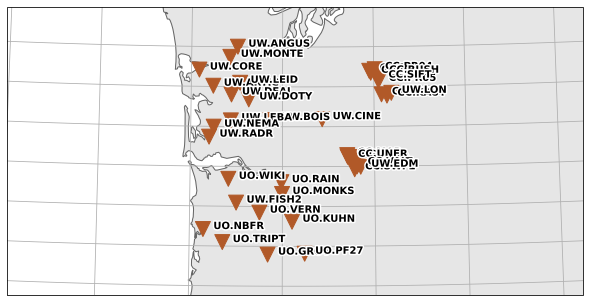

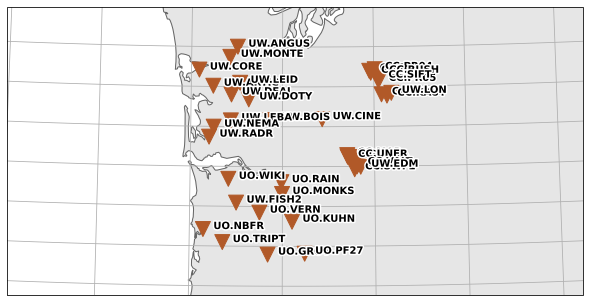

In [65]:
plt.rcParams['figure.figsize'] = 10,5
inv.plot(projection='local',resolution="f",show=False)

In [66]:
from obspy.geodetics import gps2dist_azimuth
dist  = []
ba = []
lat_eq,lon_eq = 55.474, -157.917
for i in range(len(stn_lats)):
    b = gps2dist_azimuth(stn_lats[i],stn_lons[i],lat_eq,lon_eq)
    dist.append(b[0])
    ba.append(b[1])

In [67]:
s_rotate = []
for i in range(len(stns)):
    AC = s.select(station=stns[i]) 
    s_rotate += AC.rotate(method='NE->RT',back_azimuth=ba[i])
s_rotate = obspy.Stream(s_rotate)
s_T = s_rotate.select(channel='*HT')
s_R = s_rotate.select(channel='*HR')

In [68]:
s_t = s_T.copy()
t = np.linspace(0,3600,len(s_t[0].data))
s_t.trim(starttime = s_t[0].stats.starttime+t[np.argmax(s_t[0].data)]-10*60,endtime = s_t[0].stats.starttime+t[np.argmax(s_t[0].data)]+15*60)
s_t_f = s_t.copy()
s_t_f.filter(type='bandpass',freqmin=2,freqmax=8)

34 Trace(s) in Stream:

CC.KAUT..BHT | 2021-07-29T06:17:11.960000Z - 2021-07-29T06:42:11.960000Z | 50.0 Hz, 75001 samples
...
(32 other traces)
...
UW.RADR..HHT | 2021-07-29T06:17:11.960000Z - 2021-07-29T06:42:11.960000Z | 100.0 Hz, 150001 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]

In [69]:
s_r = s_R.copy()
t = np.linspace(0,3600,len(s_r[0].data))
s_r.trim(starttime = s_r[0].stats.starttime+t[np.argmax(s_r[0].data)]-10*60,endtime = s_r[0].stats.starttime+t[np.argmax(s_r[0].data)]+15*60)
s_r_f = s_r.copy()
s_r_f.filter(type='bandpass',freqmin=2,freqmax=8)

34 Trace(s) in Stream:

CC.KAUT..BHR | 2021-07-29T06:17:59.820000Z - 2021-07-29T06:42:59.820000Z | 50.0 Hz, 75001 samples
...
(32 other traces)
...
UW.RADR..HHR | 2021-07-29T06:17:59.820000Z - 2021-07-29T06:42:59.820000Z | 100.0 Hz, 150001 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]

### 3) Plotting the filtered and unfiltered waveforms to look for correspondence between surface waves and locally triggered earthquakes and to select the best quality data


#### Plotting Transverse component

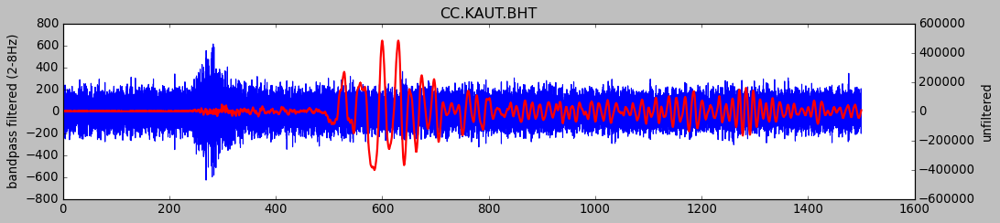

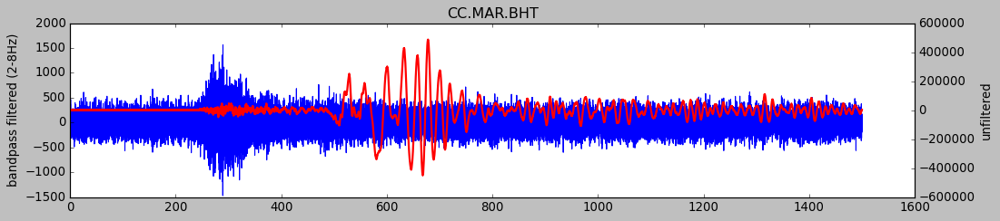

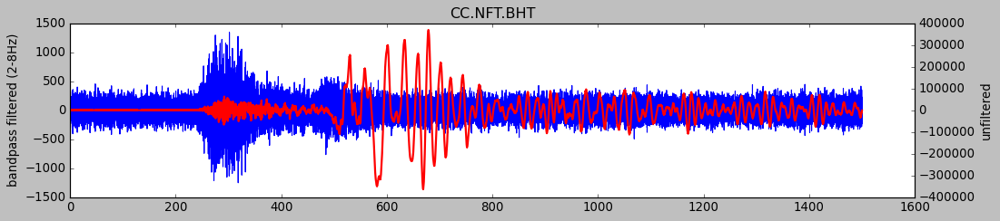

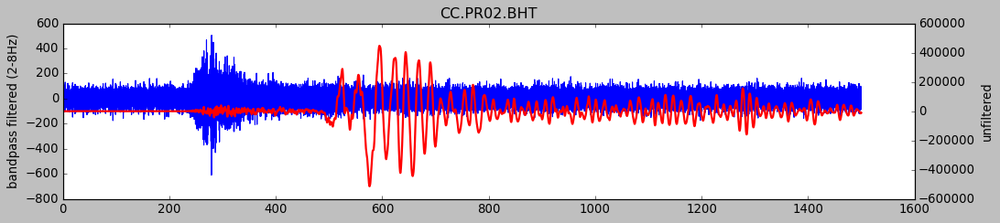

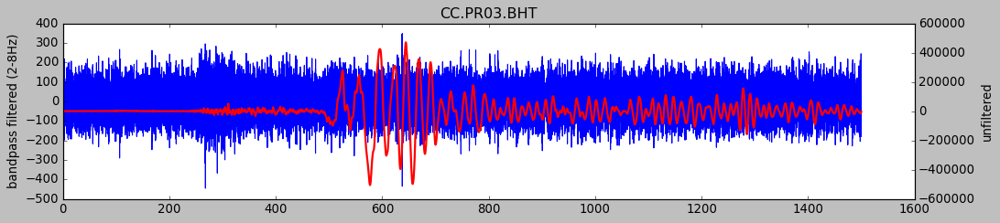

...

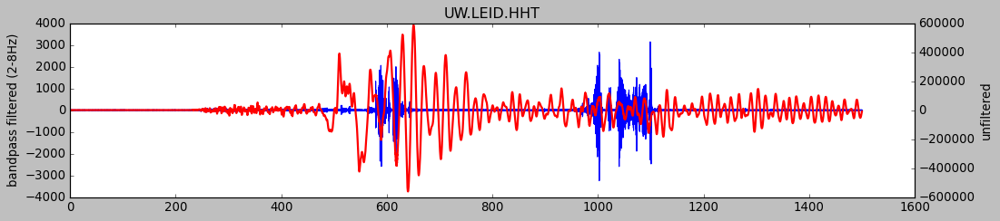

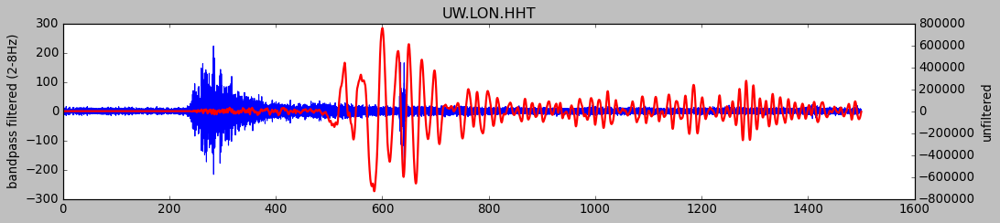

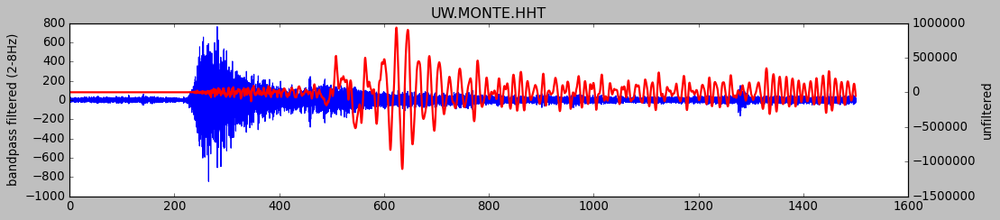

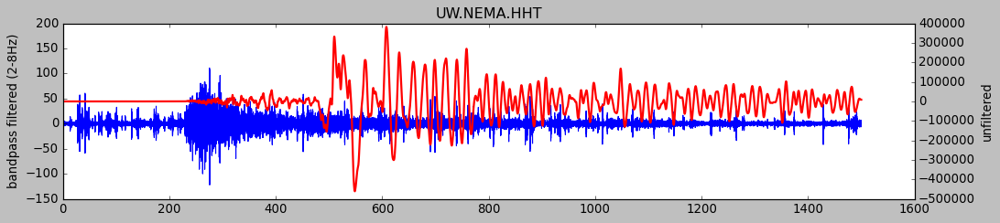

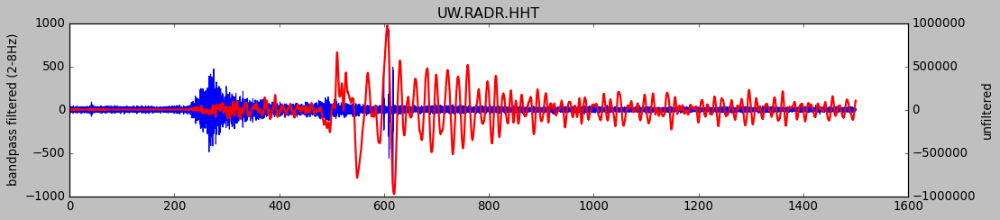

In [73]:
plt.style.use('classic')
for i in range(len(s_t)):
    fig = plt.figure(figsize=[15,3])
    ax1 = fig.add_subplot(111)
    t = np.linspace(0,len(s_t[i].data)*s_t[i].stats.delta,len(s_t[i].data))
    ax1.plot(t,s_t_f[i].data)
    ax1.set_ylabel('bandpass filtered (2-8Hz)')
    #ax1.set_xlim(0,t[-1])
    ax2 = ax1.twinx()
    ax2.plot(t,s_t[i],'r-',label='unfiltered',LineWidth=2)
    ax2.set_ylabel('unfiltered')
    #ax2.set_xlim(700,1200)
    plt.title(s_t[i].stats.network+'.'+s_t[i].stats.station+'.'+s_t[i].stats.channel)

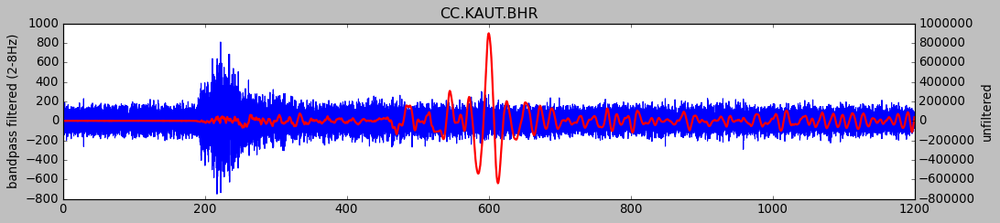

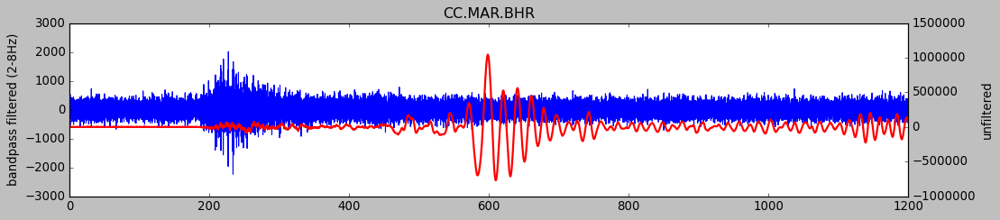

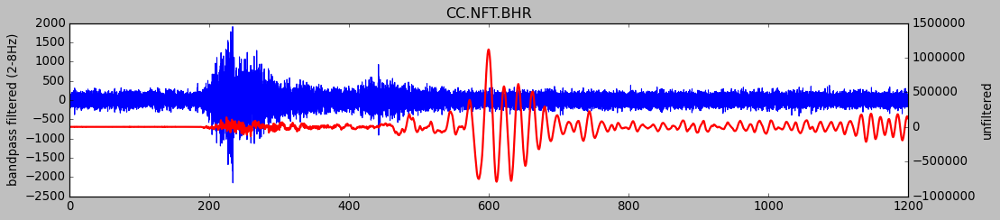

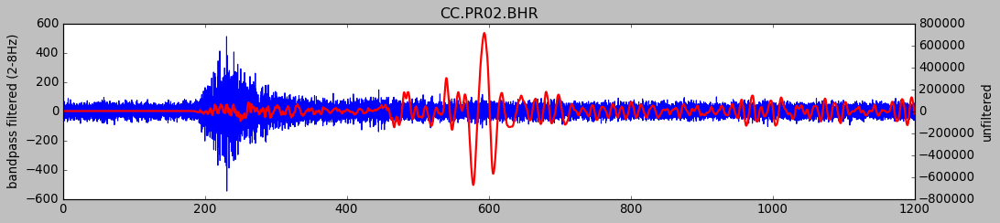

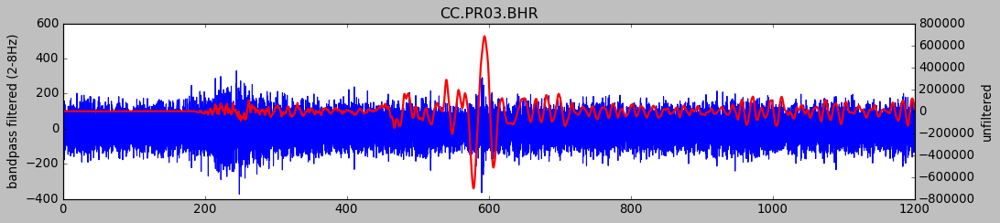

...

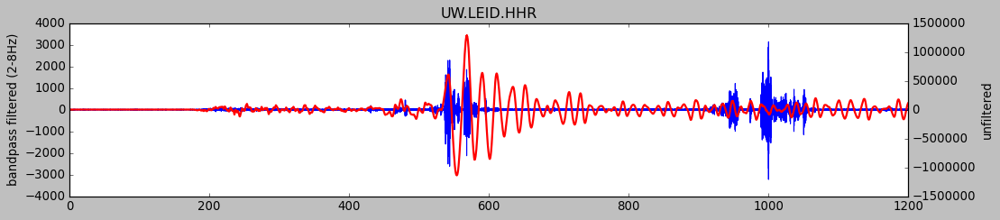

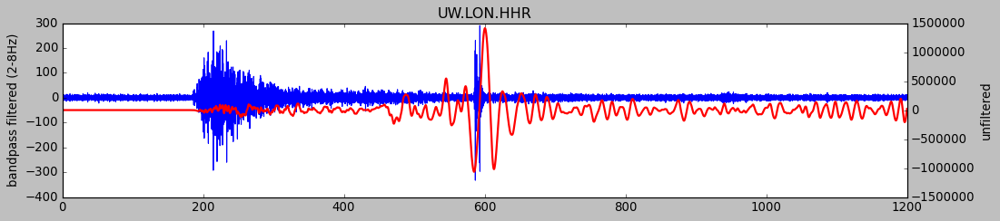

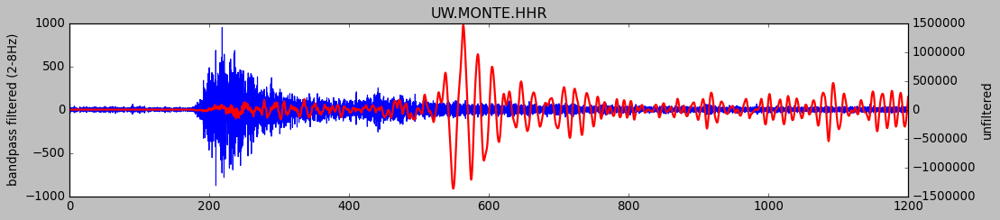

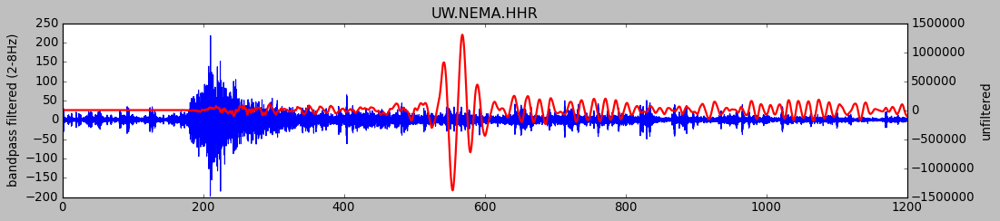

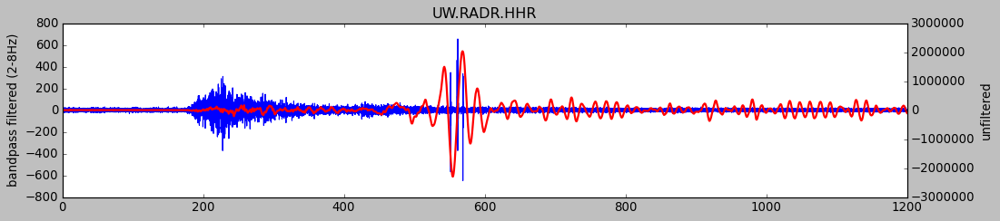

In [74]:
plt.style.use('classic')
for i in range(len(s_r)):
    fig = plt.figure(figsize=[15,3])
    ax1 = fig.add_subplot(111)
    t = np.linspace(0,len(s_r[i].data)*s_r[i].stats.delta,len(s_r[i].data))
    ax1.plot(t,s_r_f[i].data)
    ax1.set_ylabel('bandpass filtered (2-8Hz)')
    #ax1.set_xlim(0,t[-1])
    ax2 = ax1.twinx()
    ax2.plot(t,s_r[i],'r-',label='unfiltered',LineWidth=2)
    ax2.set_ylabel('unfiltered')
    ax2.set_xlim(0,1200)
    plt.title(s_r[i].stats.network+'.'+s_r[i].stats.station+'.'+s_r[i].stats.channel)

In [75]:
for i in range(len(stn_lats)):
    s_t[i].stats.distance = dist[i]
    s_t[i].stats.latitude = stn_lats[i]
    s_t[i].stats.longitude = stn_lons[i]
    s_r[i].stats.distance = dist[i]
    s_r[i].stats.latitude = stn_lats[i]
    s_r[i].stats.longitude = stn_lons[i]

### Picking out good quality stations

In [76]:
s_t_good = []
s_r_good = []
s_t_f_good = []
s_r_f_good = []

sta_list = ['RUSH','SEP','SIFT','VALT','FISH2','LEID','LON','NEMA',"RADR"]
for sta in sta_list:
    s_t_good += s_t.select(station=sta)
    s_r_good += s_r.select(station=sta)
    s_t_f_good += s_t_f.select(station=sta)
    s_r_f_good += s_r_f.select(station=sta)
    
s_t_good = obspy.Stream(s_t_good)
s_r_good = obspy.Stream(s_r_good)
s_t_f_good = obspy.Stream(s_t_f_good)
s_r_f_good = obspy.Stream(s_r_f_good)

In [77]:
stn_lats_good = []
stn_lons_good = []
for i in range(len(s_t_good)):
    stn_lats_good.append(s_t_good[i].stats.latitude)
    stn_lons_good.append(s_t_good[i].stats.longitude)

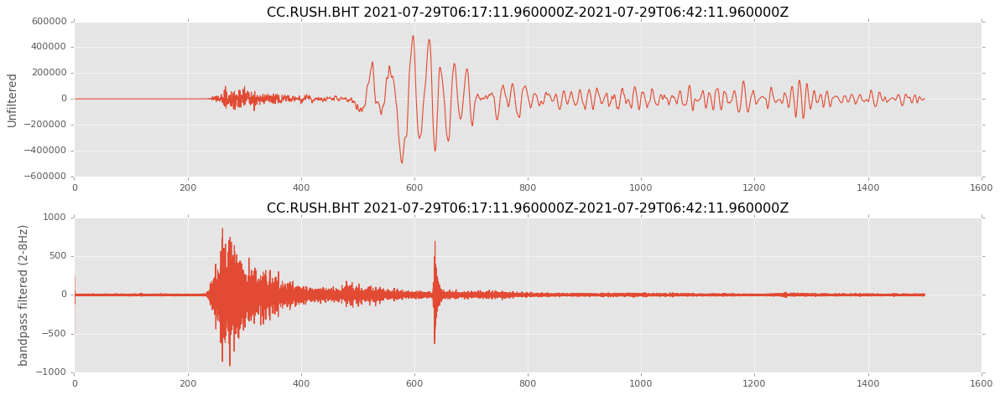

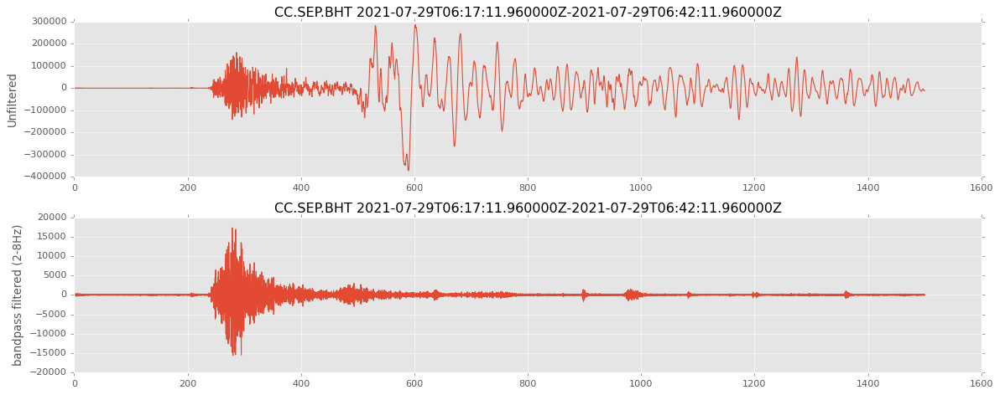

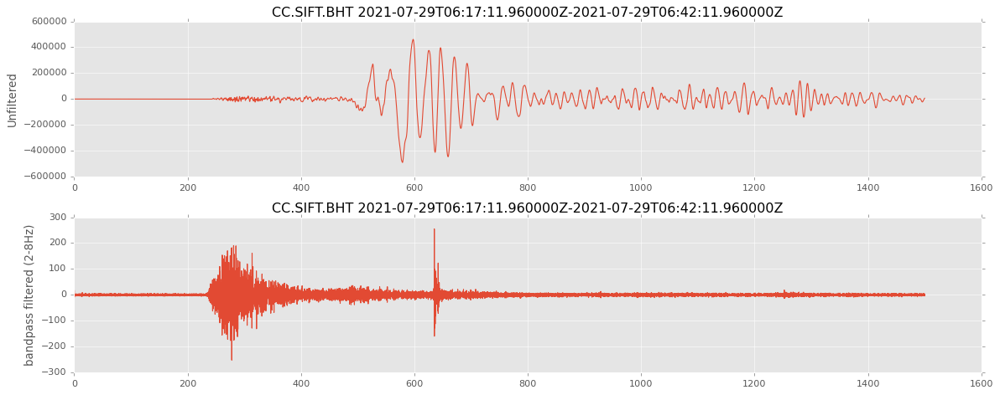

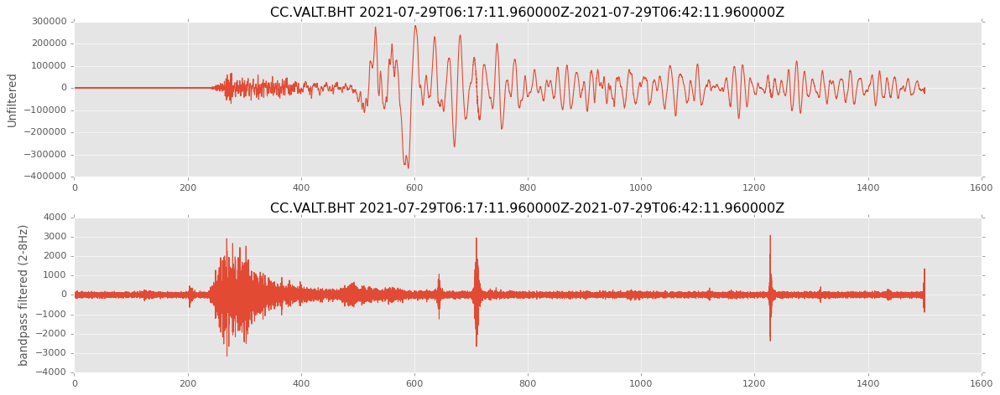

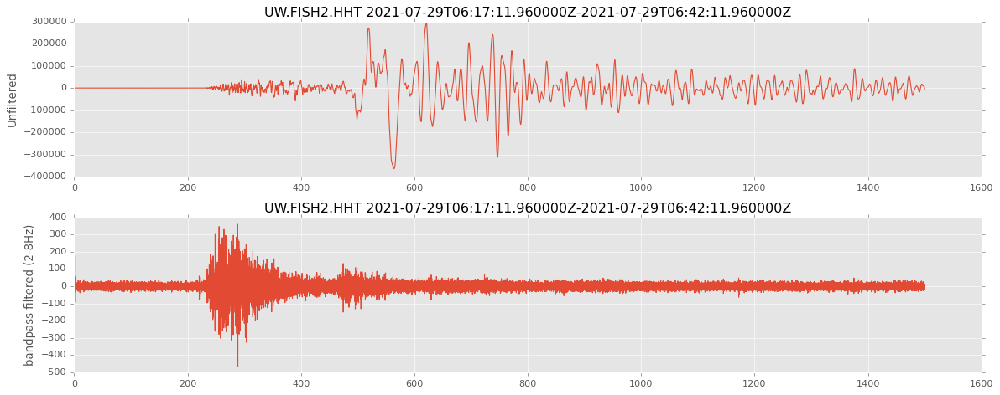

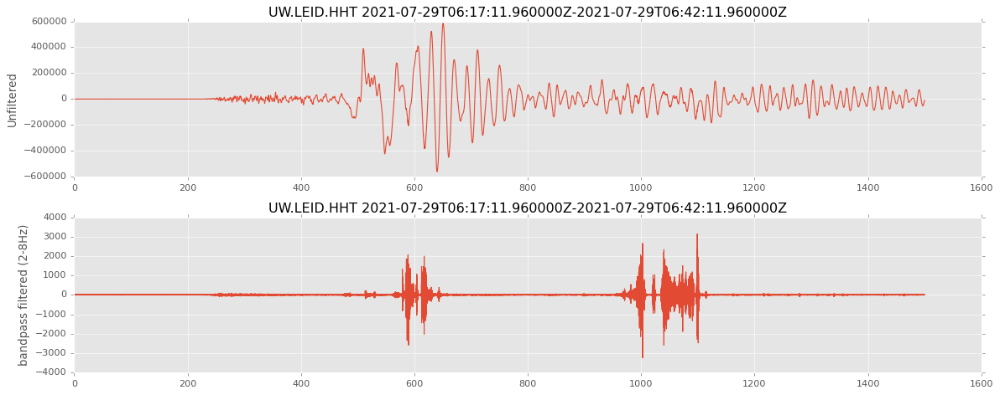

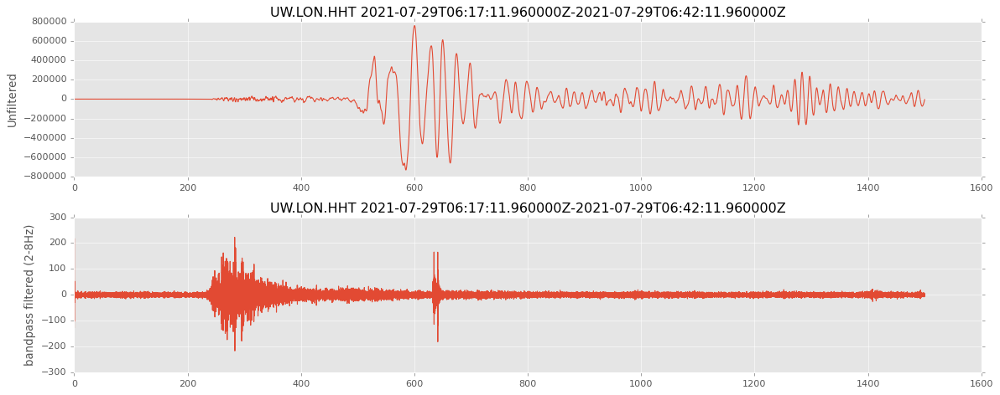

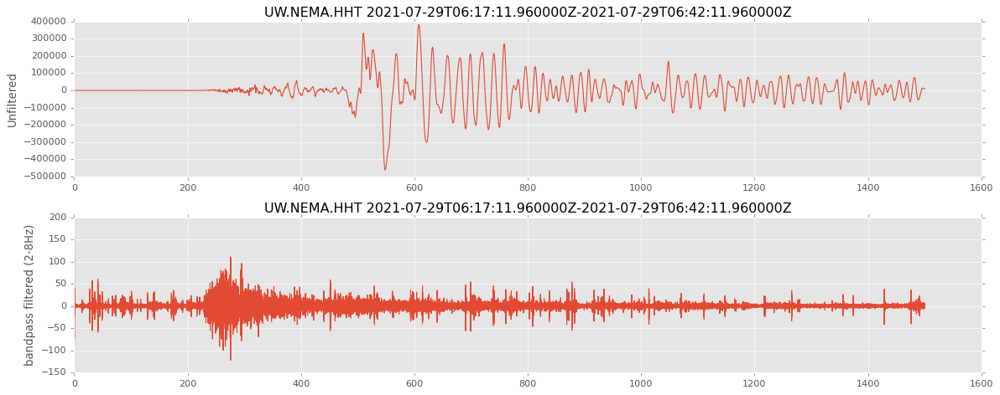

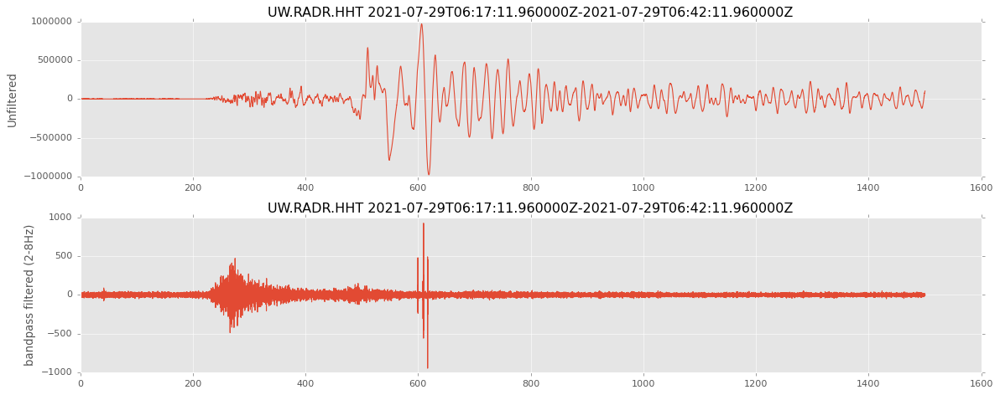

In [78]:
plt.style.use('ggplot')
for i in range(len(s_t_f_good)):
    fig,ax1 = plt.subplots(2,1,figsize=[15,6])
    t = np.linspace(0,len(s_t_f_good[i].data)*s_t_f_good[i].stats.delta,len(s_t_f_good[i].data))
    #ax1.set_xlim(t[np.argmax(s_n_f[i].data[500:-1])]-200,t[np.argmax(s_n_f[i].data[500:-1])]+200)
    #ax1[1].set_xlim(500,1200)
    ax1[1].plot(t,s_t_f_good[i].data)
    ax1[1].set_ylabel('bandpass filtered (2-8Hz)')
    ax1[1].set_title(s_t_f_good[i].stats.network+'.'+s_t_f_good[i].stats.station+'.'+s_t_f_good[i].stats.channel+' '+
             str(s_t_f_good[i].stats.starttime)+'-'+str(s_t_f_good[i].stats.endtime))
    #ax1[0].set_xlim(500,1200)
    ax1[0].plot(t,s_t_good[i].data)
    ax1[0].set_ylabel('Unfiltered')
    ax1[0].set_title(s_t_good[i].stats.network+'.'+s_t_good[i].stats.station+'.'+s_t_good[i].stats.channel+' '+
             str(s_t_good[i].stats.starttime)+'-'+str(s_t_good[i].stats.endtime))
    fig.tight_layout()

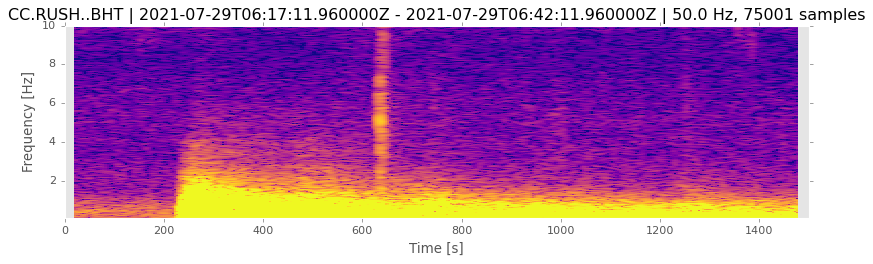

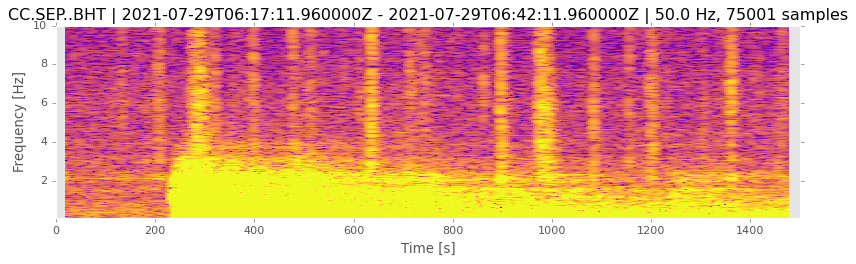

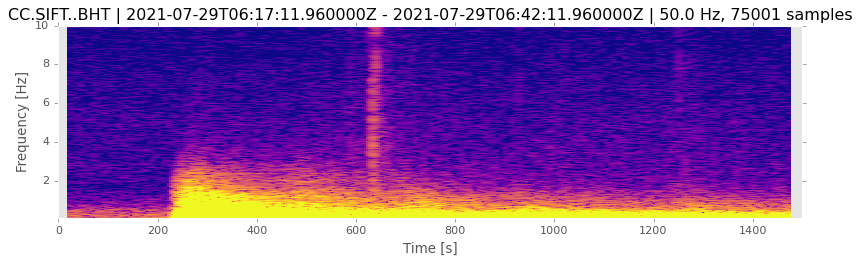

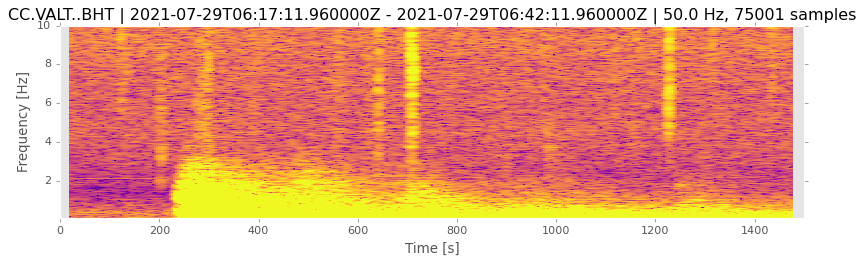

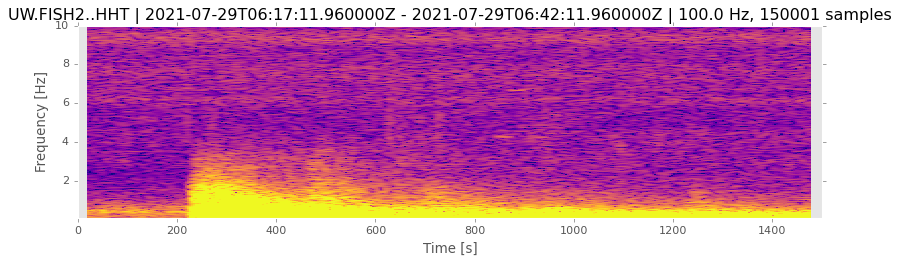

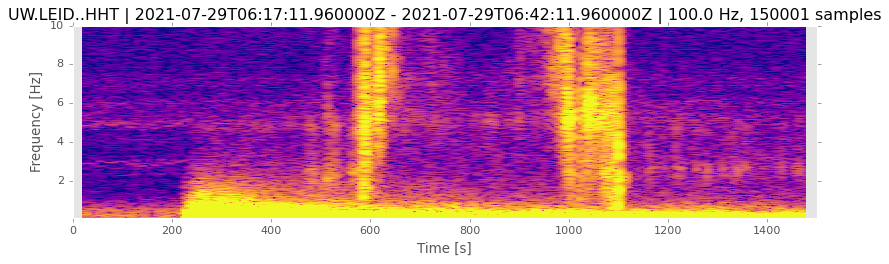

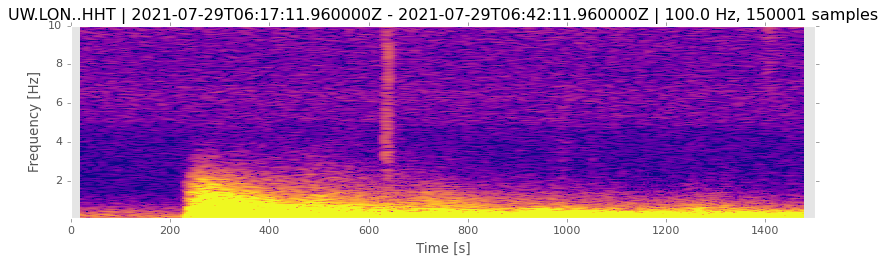

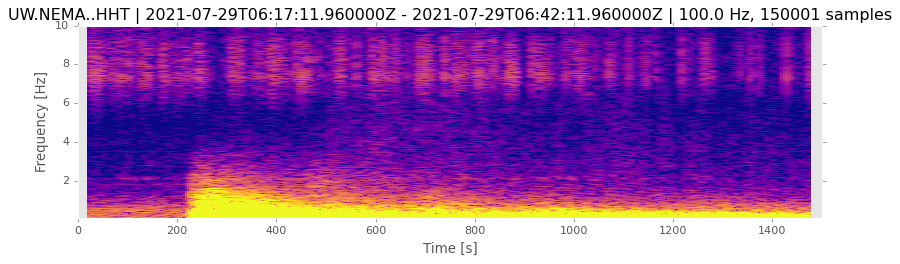

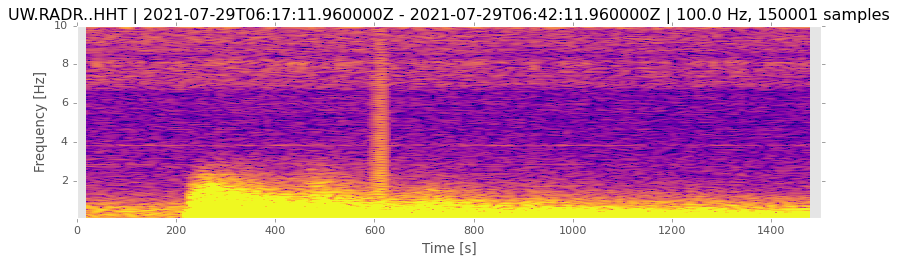

In [79]:
for i in range(len(s_t_good)):
    plt.rcParams['figure.figsize'] = 12,3
    fig = s_t_good[i].spectrogram(show=False,wlen=50,dbscale=True,cmap='plasma')
    ax = fig.axes[0]
    ax.set_ylim(0.1,10)
    #ax.set_xlim(400,800)
    im = ax.images[0]
    im.set_clim(vmin=-10,vmax=50)

### That single consistent event around 600 seconds possibly represents a triggered tremor as the area is not much seismically active and the event appears to arrive just at the time of arrival of Rayleigh waves

In [98]:
t1 = UTCDateTime("2021-07-29T05:00:00")
client = Client('IRIS')
#cat = client.get_events(starttime=t1, endtime=t1+3*3600, minmagnitude=0,latitude=lat,longitude=lon,minradius=0,maxradius=1)
cat1 = client.get_events(starttime=t1-12*3600, endtime=t1+12*3600, minmagnitude=0,latitude=lat,longitude=lon,minradius=0,maxradius=1)

In [ ]:
import matplotlib.dates as mdates
origin_time = obspy.UTCDateTime(2021, 7, 29, 6, 15, 49)
ev_lats = []
ev_lons = []
ev_depths = []
mags_1 = []
times = []
for event in cat:
    ev_lats.append(event.origins[0].latitude)
    ev_lons.append(event.origins[0].longitude)
    ev_depths.append(event.origins[0].depth)
    mags_1.append(event.magnitudes[0].mag)
    times.append(event.origins[0].time)
mags_1 = np.array(mags_1)
ev_depths = np.array(ev_depths)
times = mdates.date2num(times)
mtimes1 = mdates.date2num(origin_time)
fig1 = plt.subplots(1,1,figsize=[15,3])
plt.plot_date(times,mags_1,marker='.',MarkerSize=10)
plt.xlabel('Time(s)')
plt.ylabel('Magnitude')
plt.axvline(mtimes1,color='r',label='M8.2 Chignik earthquake')
plt.legend()
plt.title('Seismicity near Long Valley Caldera')

Text(0.5, 1.0, 'Seismicity near Mount Rainiers')

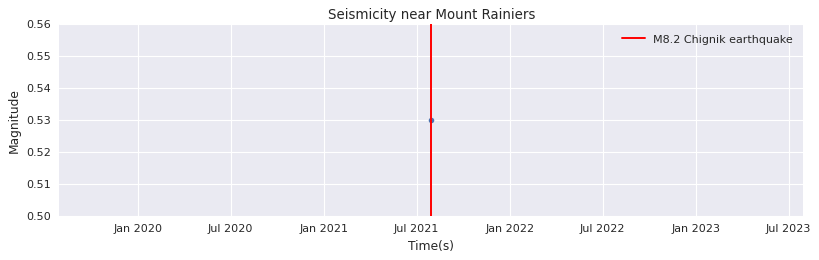

In [101]:
times = []
mags =[]
for event in cat1:
    times.append(event.origins[0].time)
    mags.append(event.magnitudes[0].mag)
    
import matplotlib.dates as mdates
mtimes = mdates.date2num(times)
ev_o_time = UTCDateTime(2021,7,29,6,15,0)
mtimes1 = mdates.date2num(ev_o_time)
plt.style.use('seaborn')


fig1 = plt.subplots(1,1,figsize=[12,3])
plt.plot_date(mtimes,mags,marker='.',MarkerSize=10)
plt.xlabel('Time(s)')
plt.ylabel('Magnitude')
plt.axvline(mtimes1,color='r',label='M8.2 Chignik earthquake')
plt.legend()
plt.title('Seismicity near Mount Rainiers')

#### It appears that the region is not very seismically active. 

In [110]:
sfiles = os.listdir('waveforms_rainier')
s = []
for i in range(len(sfiles)):
    s += obspy.read('waveforms_rainier//'+sfiles[i])

s = obspy.Stream(s)

In [111]:
tr = s.select(station='LON')
inv1 = inv.select(station='LON')
tr.remove_response(inventory=inv1,output='DISP')

lon1, lat1 = inv1[0][0].longitude, inv1[0][0].latitude
b = gps2dist_azimuth(lat1,lon1,lat_eq,lon_eq)
tr_rotate = tr.rotate(method='NE->RT',back_azimuth=b[1])

tr_f = tr_rotate.copy()
tr_f_1 = tr_rotate.copy()

tr_f = tr_f.filter(type='bandpass',freqmin=2,freqmax=8)
tr_f_1 = tr_f_1.filter(type='bandpass',freqmin=0.01,freqmax=0.1)

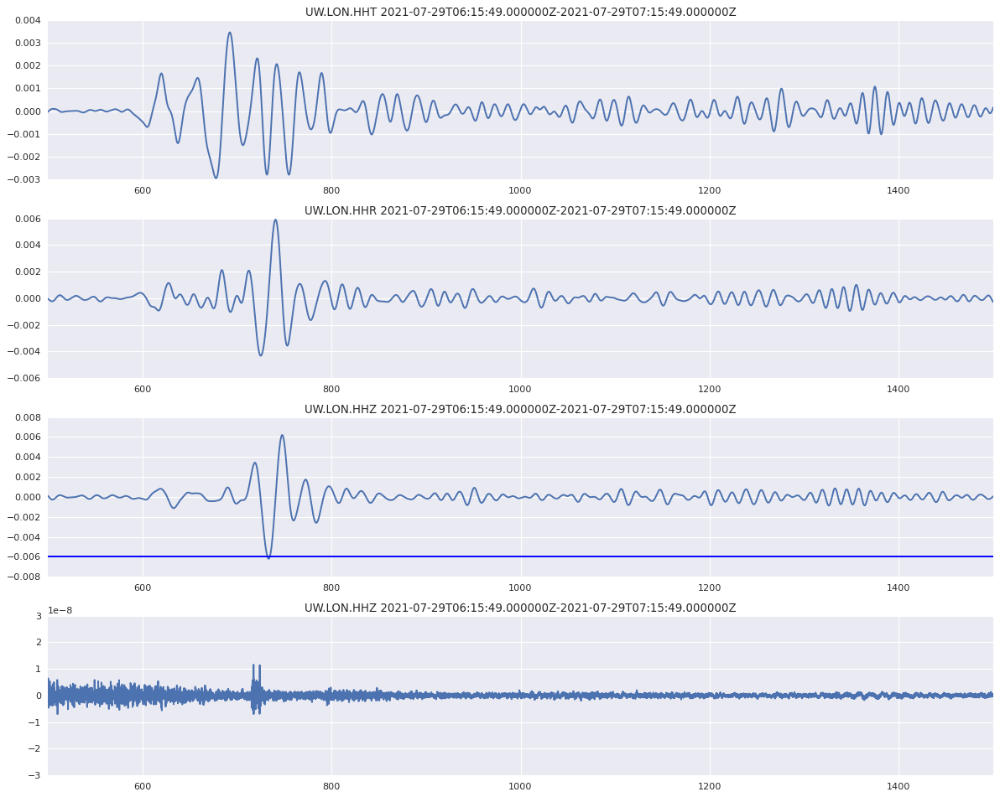

In [116]:
fig,ax = plt.subplots(4,1,figsize=[15,12])
t = np.linspace(0,3600,len(tr_f[0].data))
ax[0].plot(t,tr_f_1[0].data)
ax[0].set_xlim(500,1500)
ax[0].set_title(tr_f_1[0].stats.network+'.'+tr_f_1[0].stats.station+'.'+tr_f_1[0].stats.channel+' '+
             str(tr_f_1[0].stats.starttime)+'-'+str(tr_f_1[0].stats.endtime))

ax[1].plot(t,tr_f_1[1].data)
ax[1].set_xlim(500,1500)
ax[1].set_title(tr_f_1[1].stats.network+'.'+tr_f_1[1].stats.station+'.'+tr_f_1[1].stats.channel+' '+
             str(tr_f_1[1].stats.starttime)+'-'+str(tr_f_1[1].stats.endtime))


ax[2].plot(t,tr_f_1[2].data)
ax[2].set_xlim(500,1500)
ax[2].set_title(tr_f_1[2].stats.network+'.'+tr_f_1[2].stats.station+'.'+tr_f_1[2].stats.channel+' '+
             str(tr_f_1[2].stats.starttime)+'-'+str(tr_f_1[2].stats.endtime))
#ax[2].set_ylim(-0.002,-0.0004)
ax[2].axhline(-0.006)

ax[3].plot(t,tr_f[0].data)
ax[3].set_xlim(500,1500)
ax[3].set_title(tr_f[2].stats.network+'.'+tr_f[2].stats.station+'.'+tr_f[2].stats.channel+' '+
             str(tr_f[2].stats.starttime)+'-'+str(tr_f[2].stats.endtime))
ax[3].set_ylim(-3e-8,3e-8)
fig.tight_layout()

In [120]:
idx = np.where(tr_f_1[2].data < -0.006)

In [121]:
tarr = []
for i in range(len(idx)):
    tarr.append(t[idx[i]])

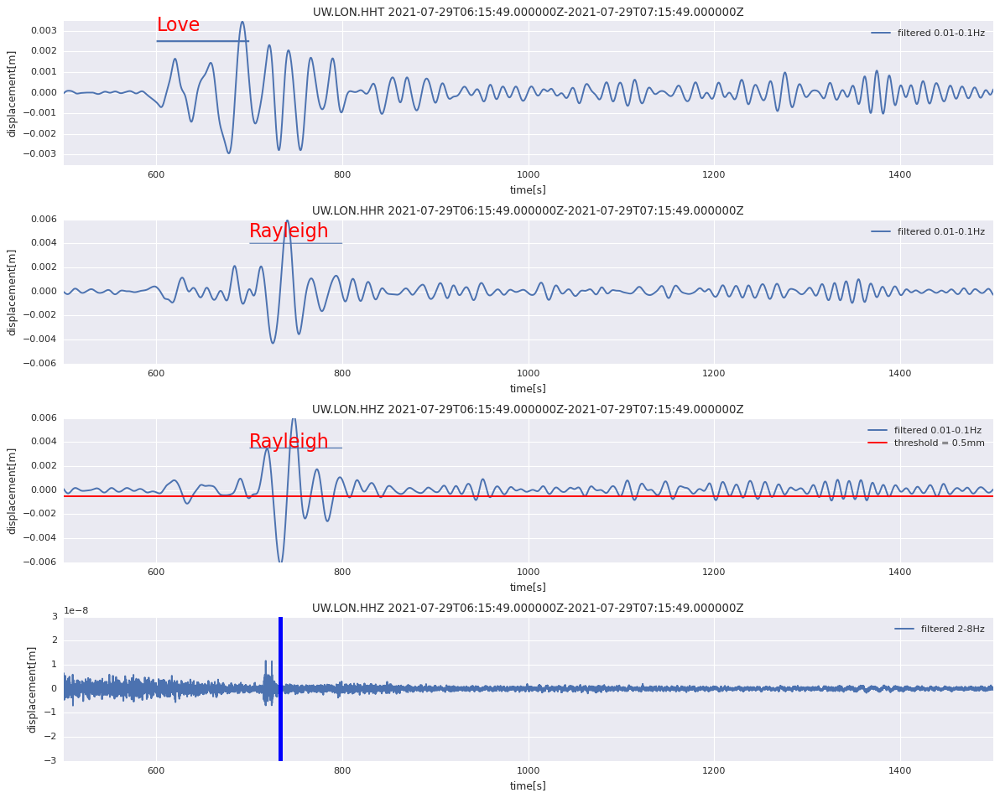

In [122]:
fig,ax = plt.subplots(4,1,figsize=[15,12])
t = np.linspace(0,3600,len(tr_f[0].data))
ax[0].plot(t,tr_f_1[0].data,label='filtered 0.01-0.1Hz')
ax[0].set_xlim(500,1500)
ax[0].set_title(tr_f_1[0].stats.network+'.'+tr_f_1[0].stats.station+'.'+tr_f_1[0].stats.channel+' '+
             str(tr_f_1[0].stats.starttime)+'-'+str(tr_f_1[0].stats.endtime))
ax[0].set_ylabel('displacement[m]')
ax[0].set_xlabel('time[s]')
ax[0].legend()
ax[0].arrow(x=600,y=0.0025,dx=100,dy=0,width=0.0001,length_includes_head=True,shape='full')
ax[0].text(x=600,y=0.003,s='Love',color='red',size=20)
ax[0].set_ylim(-0.0035,0.0035)

ax[1].plot(t,tr_f_1[1].data,label='filtered 0.01-0.1Hz')
ax[1].set_xlim(500,1500)
ax[1].set_title(tr_f_1[1].stats.network+'.'+tr_f_1[1].stats.station+'.'+tr_f_1[1].stats.channel+' '+
             str(tr_f_1[1].stats.starttime)+'-'+str(tr_f_1[1].stats.endtime))
ax[1].set_ylabel('displacement[m]')
ax[1].set_xlabel('time[s]')
ax[1].legend()
ax[1].arrow(x=700,y=0.004,dx=100,dy=0,width=0.0001,length_includes_head=True,shape='full')
ax[1].text(x=700,y=0.0045,s='Rayleigh',color='red',size=20)
#ax[0].set_ylim(-0.0035,0.0035)


ax[2].plot(t,tr_f_1[2].data,label='filtered 0.01-0.1Hz')
ax[2].set_xlim(500,1500)
ax[2].set_title(tr_f_1[2].stats.network+'.'+tr_f_1[2].stats.station+'.'+tr_f_1[2].stats.channel+' '+
             str(tr_f_1[2].stats.starttime)+'-'+str(tr_f_1[2].stats.endtime))
#ax[2].set_ylim(-0.002,-0.0004)
ax[2].axhline(-0.0005,color='red',label='threshold = 0.5mm')
ax[2].set_ylabel('displacement[m]')
ax[2].set_xlabel('time[s]')
ax[2].legend()
ax[2].arrow(x=700,y=0.0035,dx=100,dy=0,width=0.0001,length_includes_head=True,shape='full')
ax[2].text(x=700,y=0.0035,s='Rayleigh',color='red',size=20)
ax[2].set_ylim(-0.006,0.006)


ax[3].plot(t,tr_f[0].data,label='filtered 2-8Hz')
ax[3].set_xlim(500,1500)
ax[3].set_title(tr_f[2].stats.network+'.'+tr_f[2].stats.station+'.'+tr_f[2].stats.channel+' '+
             str(tr_f[2].stats.starttime)+'-'+str(tr_f[2].stats.endtime))
ax[3].set_ylim(-3e-8,3e-8)
for i in range(len(tarr[0])):
    ax[3].axvline(tarr[0][i])
ax[3].set_ylabel('displacement[m]')
ax[3].set_xlabel('time[s]')
ax[3].legend()
fig.tight_layout()

### The event arrived near the time of arrival of Rayleigh waves which can be clearly seen on Z and R component

In [91]:
import pygmt

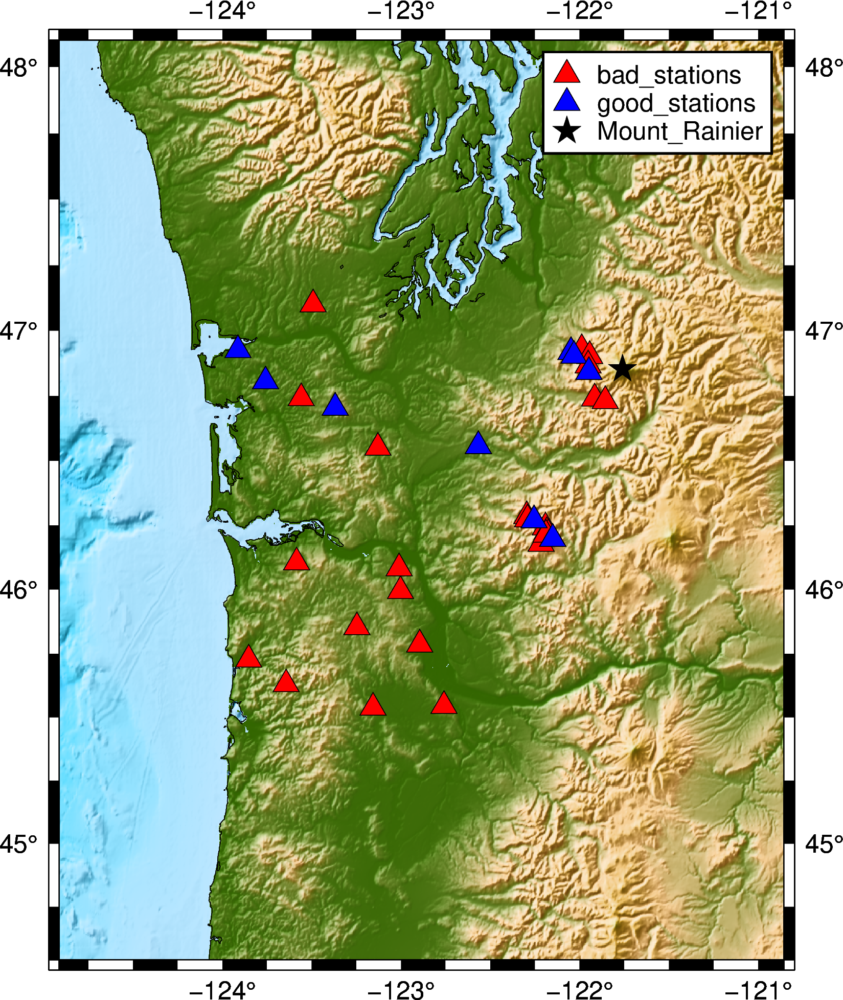

In [96]:
## Salcha earthquake
plt.rcParams['figure.figsize'] = 10,10
region=[np.min(stn_lons)-1,np.max(stn_lons)+1,np.min(stn_lats)-1,np.max(stn_lats)+1]
fig = pygmt.Figure()


pygmt.makecpt(cmap='etopo1',series='-10000/10000/1000',continuous=True)

topo_data = '@earth_relief_15s'
#mag_size = 0.01 *2** mags_1

fig.grdimage(grid=topo_data,region=region,projection='M12c',shading=True,frame=True)
#pygmt.makecpt(cmap="viridis", series=[np.min(ev_depths/1000), np.max(ev_depths/1000)])
fig.coast(
    shorelines=True,
    frame=True,)

fig.plot(
    x=stn_lons,
    y=stn_lats,
    style= 't0.5c',
    color = 'red',
    pen='black',
    label=f'bad_stations',
)


fig.plot(
    x=stn_lons_good,
    y=stn_lats_good,
    style='t0.5c',
    color='blue',
    pen='black',
    label=f'good_stations',
)




fig.plot(x=lon,y=lat,style='a0.5c',color='black',label=f'Mount_Rainier')
#fig.colorbar(frame='af+l"Depth (km)"')

fig.legend()
fig.show()